In [17]:
#Univariate Selection for Steps feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:21]  #independent columns
y = data.iloc[:,-1]    #target column i.e garmin steps
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for Steps','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

#featureScores.to_excel('steps_univariate.xlsx', index=False)

                           Predictors for Steps          Score
19                  ema_steps_goal_number_no_NA  327847.472590
6          ema_breakfast_colourful_rating_no_NA    3146.387804
8              ema_lunch_colourful_rating_no_NA    2424.896402
10            ema_dinner_colourful_rating_no_NA    1648.619666
2                ema_daily_total_education_read     940.100000
3   ema_daily_education_library_accessed_binary     119.060000
14      ema_group_exercise_participation_binary     115.000000
4                         ema_veg_portions_goal     113.968706
12                   ema_had_alcohol_last_night     111.000000
15             ema_morning_exercise_plan_binary     106.000000


In [66]:
# automatically select the number of features for RFE
# report which features were selected by RFE
from sklearn.datasets import make_classification
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
import pandas as pd
# define dataset
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column Garmin steps

#rfe = RFE(estimator=DecisionTreeClassifier(), n_features_to_select=5)
# fit RFE
rfe.fit(X, y)

# summarize all features
for i in range(X.shape[1]):
    if(rfe.support_[i]):
    #{
        print('Column: %d, %s, Selected %s, Rank: %.3f' % (i, X.columns[i], rfe.support_[i], rfe.ranking_[i]))
   # }
# plot model performance for comparison
#pyplot.boxplot(results, labels=names, showmeans=True)
#pyplot.show()  
#X, y = make_classification(n_samples=1000, n_features=10, n_informative=5, n_redundant=5, random_state=1)
# create pipeline
#rfe = RFECV(estimator=DecisionTreeClassifier())
#model = DecisionTreeClassifier()
#pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
#n_scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
#print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))
#from sklearn.feature_selection import RFE

#from sklearn.svm import SVR

#from sklearn.datasets import fetch_california_housing

#data = fetch_california_housing()

#X, y = data.data, data.target

#estimator = SVR(kernel="linear")

#selector = RFE(estimator, n_features_to_select=5, step=1)

#selector.fit(X, y)

#print(selector.support_)

#print(selector.ranking_)


Column: 4, ema_veg_portions_goal, Selected True, Rank: 1.000
Column: 6, ema_breakfast_colourful_rating_no_NA, Selected True, Rank: 1.000
Column: 8, ema_lunch_colourful_rating_no_NA, Selected True, Rank: 1.000
Column: 10, ema_dinner_colourful_rating_no_NA, Selected True, Rank: 1.000
Column: 21, ema_sleep_quality_transformed_scale, Selected True, Rank: 1.000


In [49]:
# explore the algorithm wrapped by RFE
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from matplotlib import pyplot
import pandas as pd

data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
# get the dataset
def get_dataset():
 #X, y = make_classification(n_samples=1000, n_features=10, n_informative=5, n_redundant=5, random_state=1)
    # define dataset
 X = data.iloc[:,0:22]  #independent columns
 y = data.iloc[:,-1]    #target column Garmin steps
 return X, y
 
# get a list of models to evaluate
def get_models():
 models = dict()
 # lr
 rfe = RFE(estimator=LogisticRegression(), n_features_to_select=5)
 model = DecisionTreeClassifier()
 models['lr'] = Pipeline(steps=[('s',rfe),('m',model)])
 # perceptron
 rfe = RFE(estimator=Perceptron(), n_features_to_select=5)
 model = DecisionTreeClassifier()
 models['per'] = Pipeline(steps=[('s',rfe),('m',model)])
 # cart
 rfe = RFE(estimator=DecisionTreeClassifier(), n_features_to_select=5)
 model = DecisionTreeClassifier()
 models['cart'] = Pipeline(steps=[('s',rfe),('m',model)])
 # rf
 rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=5)
 model = DecisionTreeClassifier()
 models['rf'] = Pipeline(steps=[('s',rfe),('m',model)])
 # gbm
 rfe = RFE(estimator=GradientBoostingClassifier(), n_features_to_select=5)
 model = DecisionTreeClassifier()
 models['gbm'] = Pipeline(steps=[('s',rfe),('m',model)])
 return models
 
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
 cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
 scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
 return scores
 
# define dataset
X, y = get_dataset()
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
print(names)
#for name, model in models.items():
#scores = evaluate_model(model, X, y)
# results.append(scores)
# names.append(name)
# print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
#pyplot.boxplot(results, labels=names, showmeans=True)
#pyplot.show()

[]


[0.02399437 0.04403649 0.02864486 0.02451825 0.08121314 0.06906775
 0.08685487 0.02093649 0.09786574 0.01703602 0.09790023 0.01440148
 0.02603617 0.03116663 0.0268945  0.03034642 0.04031107 0.04012477
 0.02135894 0.07787326 0.03394875 0.0654698 ]


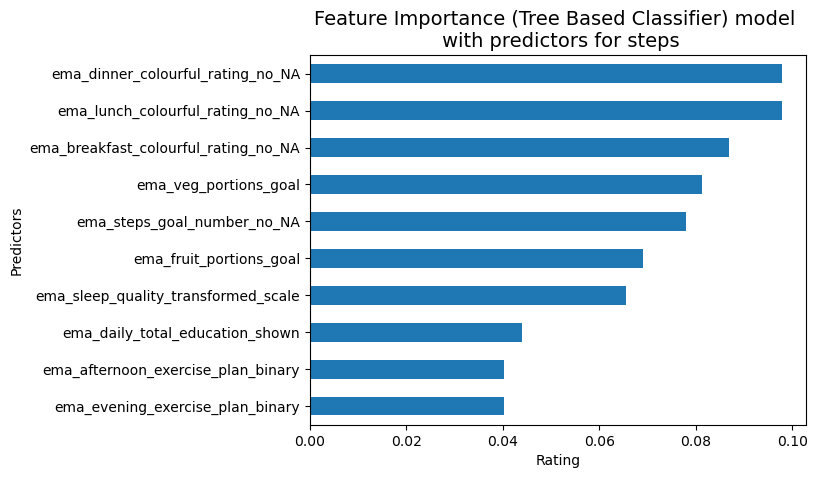

In [100]:
#Feature Importance for Steps
import pandas as pd
import numpy as np
import random
random.seed(10)
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column Garmin steps
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for steps', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

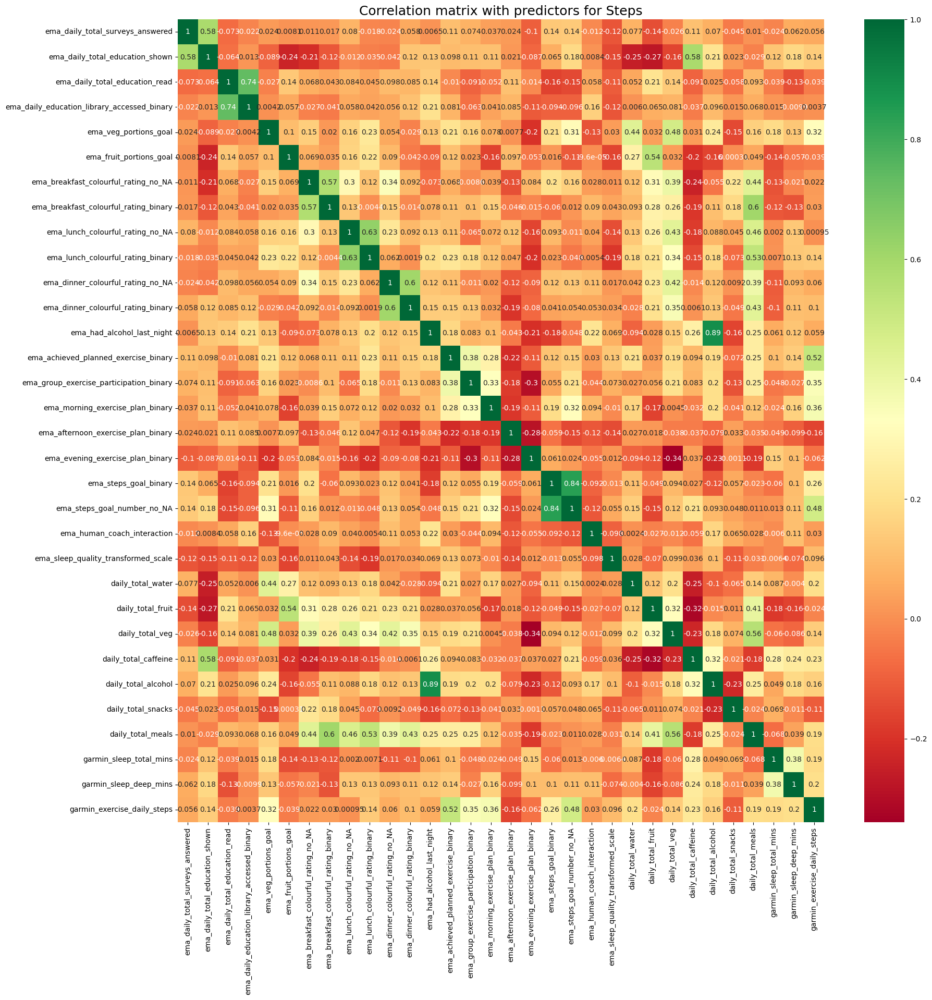

In [63]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column i.e price range
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for Steps', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [125]:
#Univariate Selection for total sleep feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column i.e garmin total sleep minutes
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for Total Sleep minutes','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('total_sleep_univariate.xlsx', index=False)

             Predictors for Total Sleep minutes          Score
19                  ema_steps_goal_number_no_NA  264546.061818
6          ema_breakfast_colourful_rating_no_NA    2609.291233
8              ema_lunch_colourful_rating_no_NA    2167.105047
10            ema_dinner_colourful_rating_no_NA    1315.442199
2                ema_daily_total_education_read     878.966667
3   ema_daily_education_library_accessed_binary     103.380000
14      ema_group_exercise_participation_binary      95.859375
4                         ema_veg_portions_goal      92.082504
12                   ema_had_alcohol_last_night      89.902778
15             ema_morning_exercise_plan_binary      81.500000


[0.02375744 0.05065847 0.02460516 0.02054155 0.07859367 0.0695843
 0.09526891 0.02014664 0.09394893 0.01369743 0.09678383 0.01313265
 0.03121474 0.03192698 0.02838967 0.03480888 0.03115296 0.04085699
 0.02303949 0.07840518 0.04100928 0.05847686]


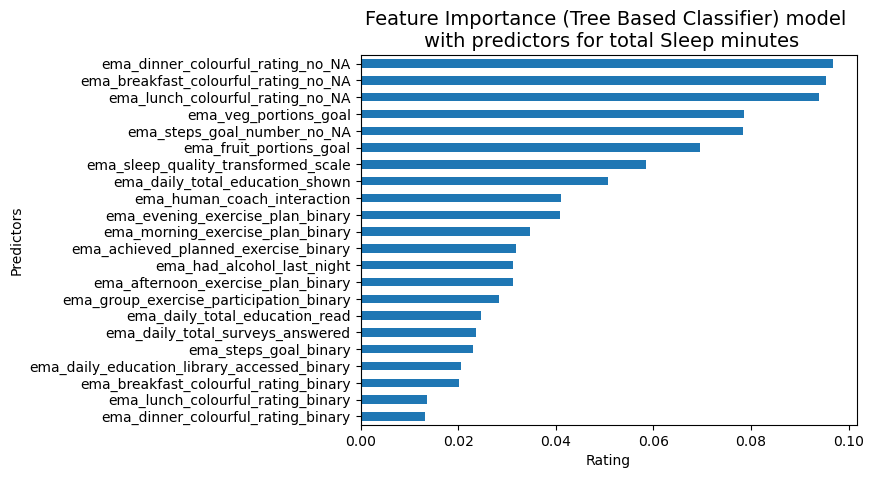

In [108]:
#Feature Importance for total sleep
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column total sleep
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for total Sleep minutes', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

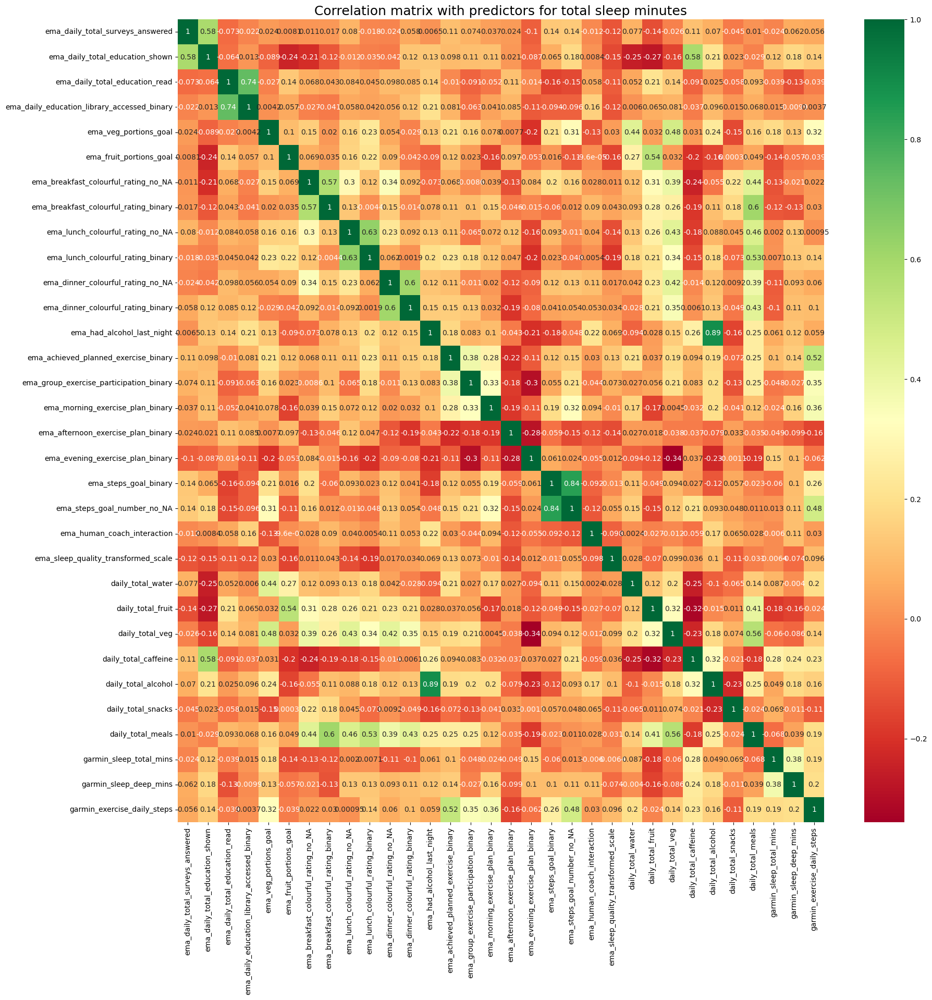

In [66]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column total sleep
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for total sleep minutes', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [126]:
#Univariate Selection for Deep Sleep feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column i.e garmin deep sleep minutes
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for Deep Sleep minutes','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('deep_sleep_univariate.xlsx', index=False)

              Predictors for Deep Sleep minutes          Score
19                  ema_steps_goal_number_no_NA  272357.145347
6          ema_breakfast_colourful_rating_no_NA    2314.908420
8              ema_lunch_colourful_rating_no_NA    1854.849855
10            ema_dinner_colourful_rating_no_NA    1313.534809
2                ema_daily_total_education_read     818.650000
14      ema_group_exercise_participation_binary      94.710937
3   ema_daily_education_library_accessed_binary      94.560000
4                         ema_veg_portions_goal      91.786273
15             ema_morning_exercise_plan_binary      89.567073
12                   ema_had_alcohol_last_night      86.159722


[0.01831463 0.04798186 0.02560078 0.0218927  0.07849007 0.06733393
 0.09293764 0.02431317 0.09067288 0.01480905 0.09771642 0.01216701
 0.03190888 0.03504278 0.0255346  0.02916542 0.04013048 0.03992111
 0.02314576 0.07924961 0.03685837 0.06681286]


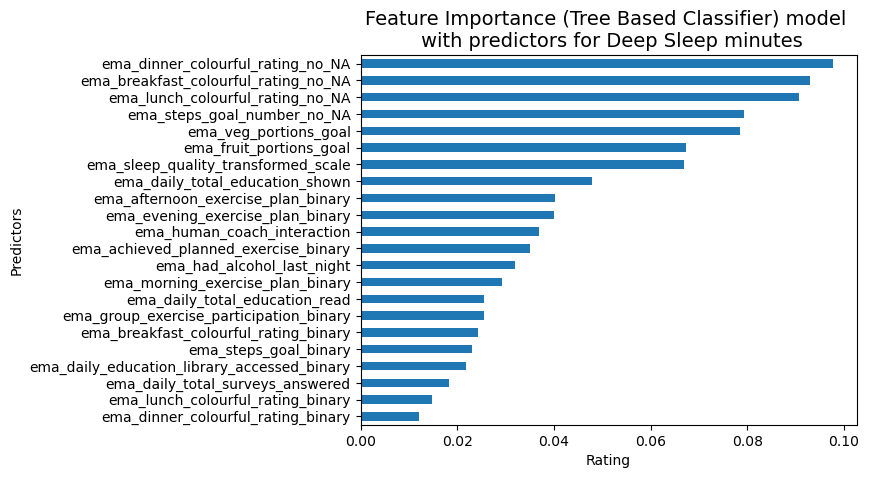

In [104]:
#Feature Importance for Deep Sleep
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column Deep Sleep
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for Deep Sleep minutes', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

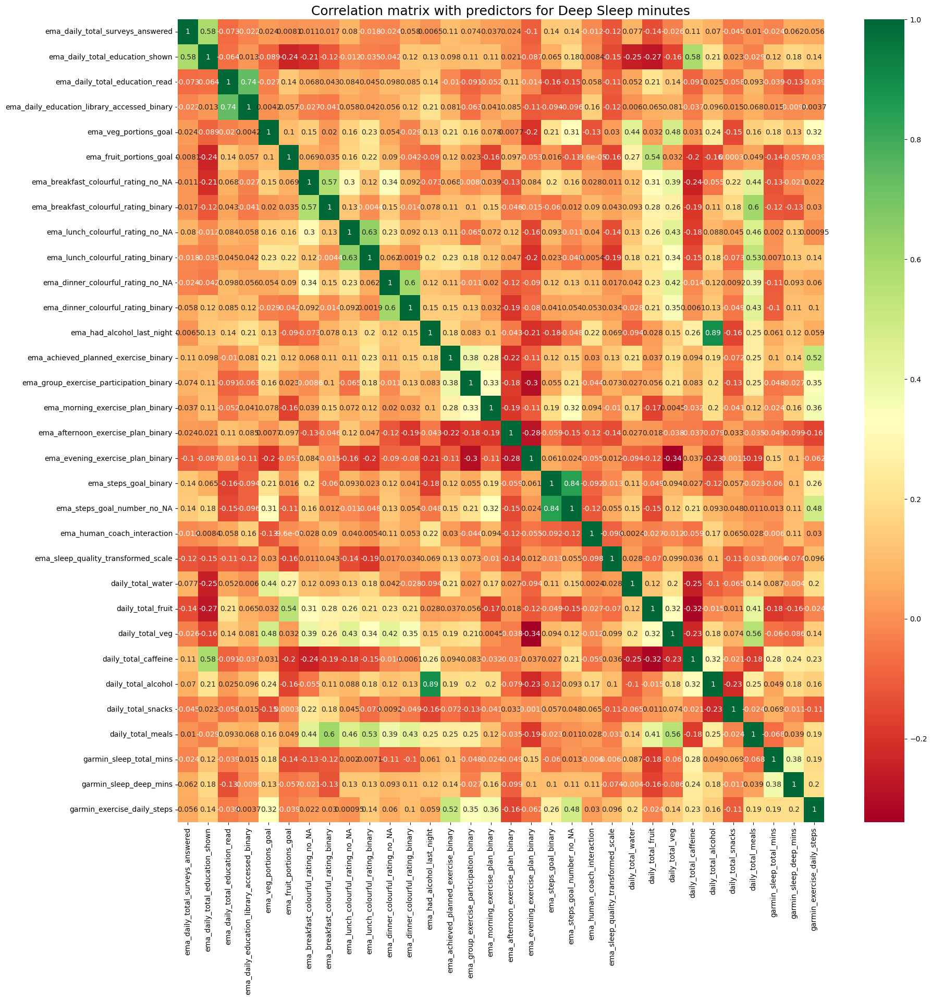

In [69]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column Deep Sleep minutes
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for Deep Sleep minutes', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [146]:
#Univariate Selection for Fruit feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column fruit
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for portions of Fruit','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('fruit_univariate.xlsx', index=False)

               Predictors for portions of Fruit         Score
19                  ema_steps_goal_number_no_NA  24980.188274
6          ema_breakfast_colourful_rating_no_NA    538.533071
8              ema_lunch_colourful_rating_no_NA    403.964679
2                ema_daily_total_education_read    349.689776
10            ema_dinner_colourful_rating_no_NA    168.881773
5                       ema_fruit_portions_goal     15.228267
15             ema_morning_exercise_plan_binary     11.126966
14      ema_group_exercise_participation_binary     10.657237
3   ema_daily_education_library_accessed_binary     10.030419
17             ema_evening_exercise_plan_binary     10.008471


[0.02488834 0.04665649 0.03060134 0.0236638  0.07226349 0.07969083
 0.08231502 0.02539474 0.0828324  0.01594654 0.08948465 0.02001967
 0.0296391  0.04229642 0.02421709 0.03003039 0.03675259 0.03626602
 0.02513034 0.08054928 0.03773453 0.06362691]


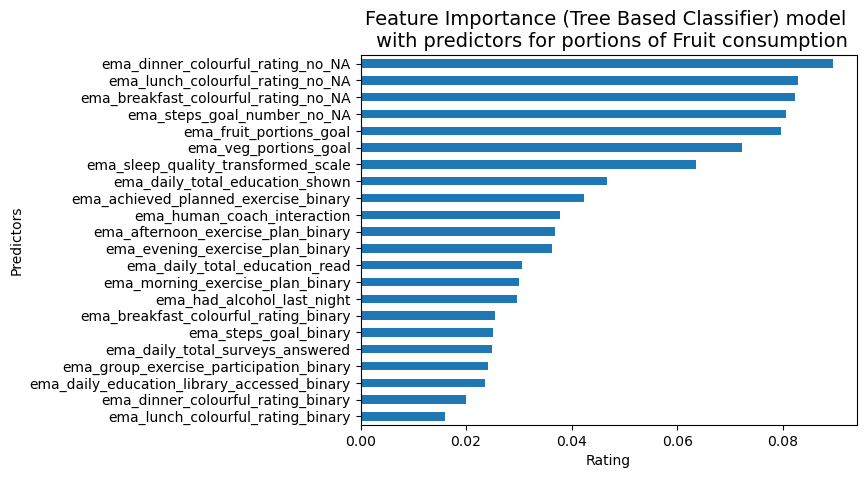

In [123]:
#Feature Importance for Fruit
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column fruit
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for portions of Fruit consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()


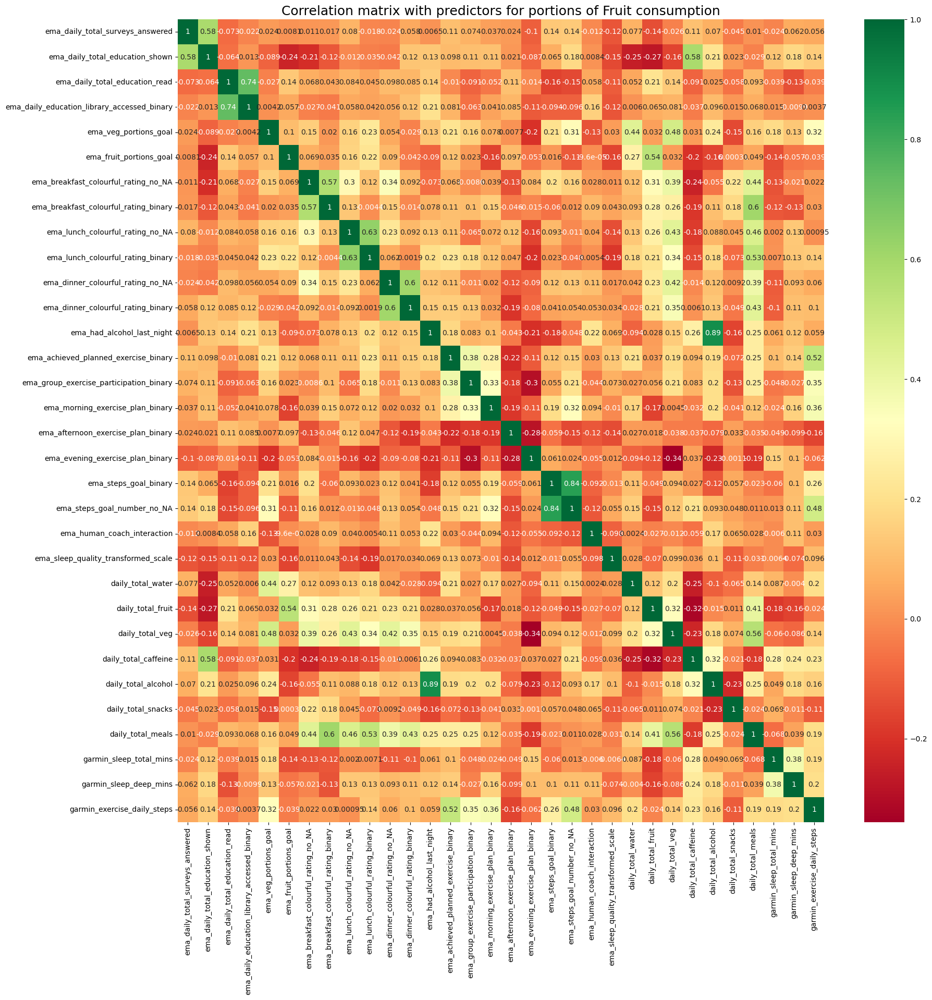

In [72]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column Fruit
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for portions of Fruit consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [127]:
#Univariate Selection for Veg feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for portions of Vegetables','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('veg_univariate.xlsx', index=False)

          Predictors for portions of Vegetables         Score
19                  ema_steps_goal_number_no_NA  23788.472858
6          ema_breakfast_colourful_rating_no_NA    676.082716
8              ema_lunch_colourful_rating_no_NA    588.140717
10            ema_dinner_colourful_rating_no_NA    511.806061
2                ema_daily_total_education_read     72.065614
4                         ema_veg_portions_goal     38.811038
17             ema_evening_exercise_plan_binary     20.816964
12                   ema_had_alcohol_last_night     20.542227
3   ema_daily_education_library_accessed_binary     11.765474
13         ema_achieved_planned_exercise_binary     11.229684


[0.02422938 0.04862285 0.02363426 0.02468081 0.08303881 0.06547153
 0.08823264 0.02164595 0.08946263 0.01897889 0.09064096 0.01532442
 0.03430795 0.03542613 0.02643815 0.03528569 0.03614038 0.03812273
 0.02284273 0.07922695 0.04092698 0.0573192 ]


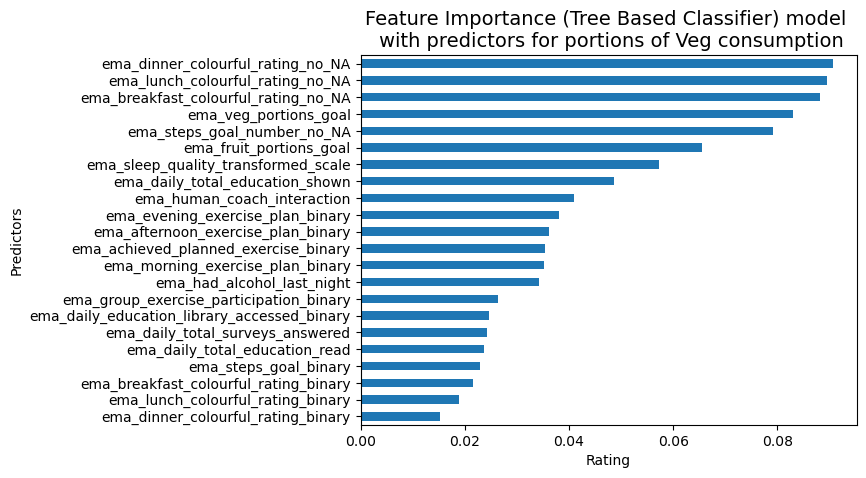

In [128]:
#Feature Importance for veg
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for portions of Veg consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

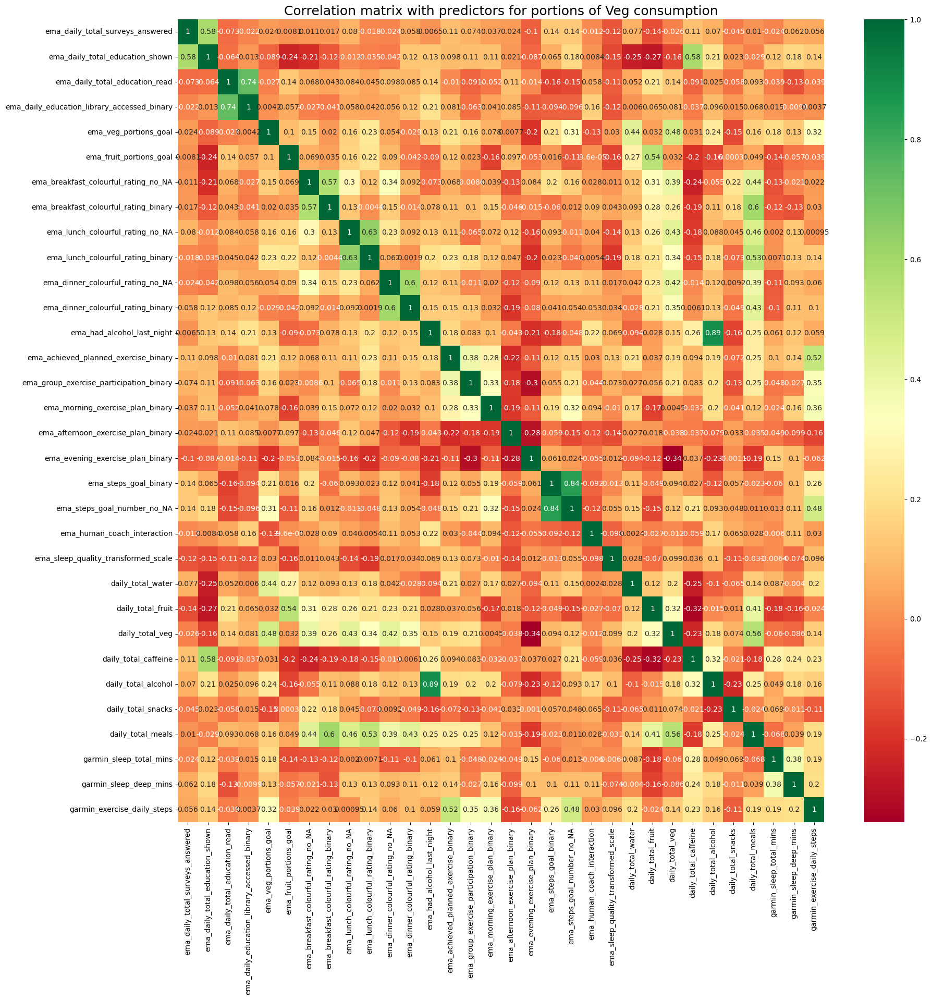

In [75]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for portions of Veg consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [129]:
#Univariate Selection for Water feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for glasses of water consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('water_univariate.xlsx', index=False)

    Predictors for glasses of water consumption         Score
19                  ema_steps_goal_number_no_NA  31617.904291
8              ema_lunch_colourful_rating_no_NA    217.393040
6          ema_breakfast_colourful_rating_no_NA    174.036670
2                ema_daily_total_education_read    148.409559
10            ema_dinner_colourful_rating_no_NA     98.069156
4                         ema_veg_portions_goal     37.967660
3   ema_daily_education_library_accessed_binary     14.843382
15             ema_morning_exercise_plan_binary     12.214939
12                   ema_had_alcohol_last_night      8.356924
20                  ema_human_coach_interaction      7.919118


[0.02349191 0.04645777 0.03515223 0.02565447 0.09924602 0.07511963
 0.08203801 0.02326051 0.08491291 0.01877834 0.08640698 0.00979925
 0.03200938 0.03308767 0.02318358 0.03181851 0.03909678 0.03466625
 0.0243871  0.07288147 0.03597842 0.0625728 ]


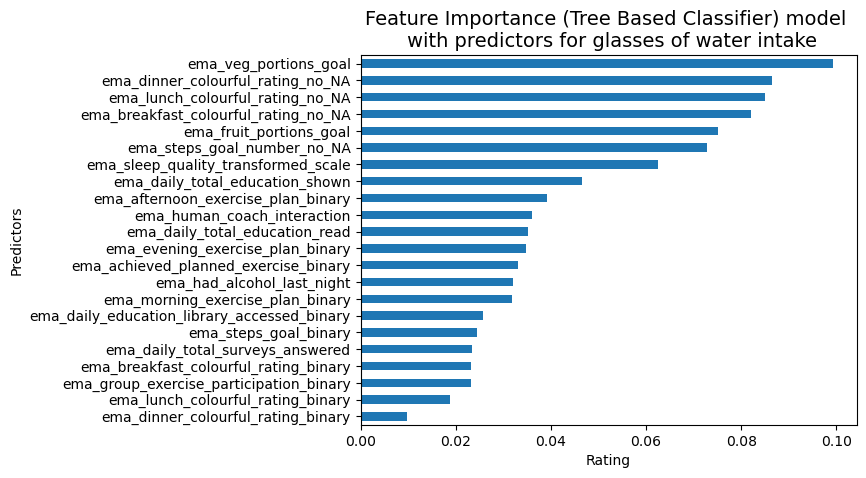

In [131]:
#Feature Importance for water
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for glasses of water intake', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

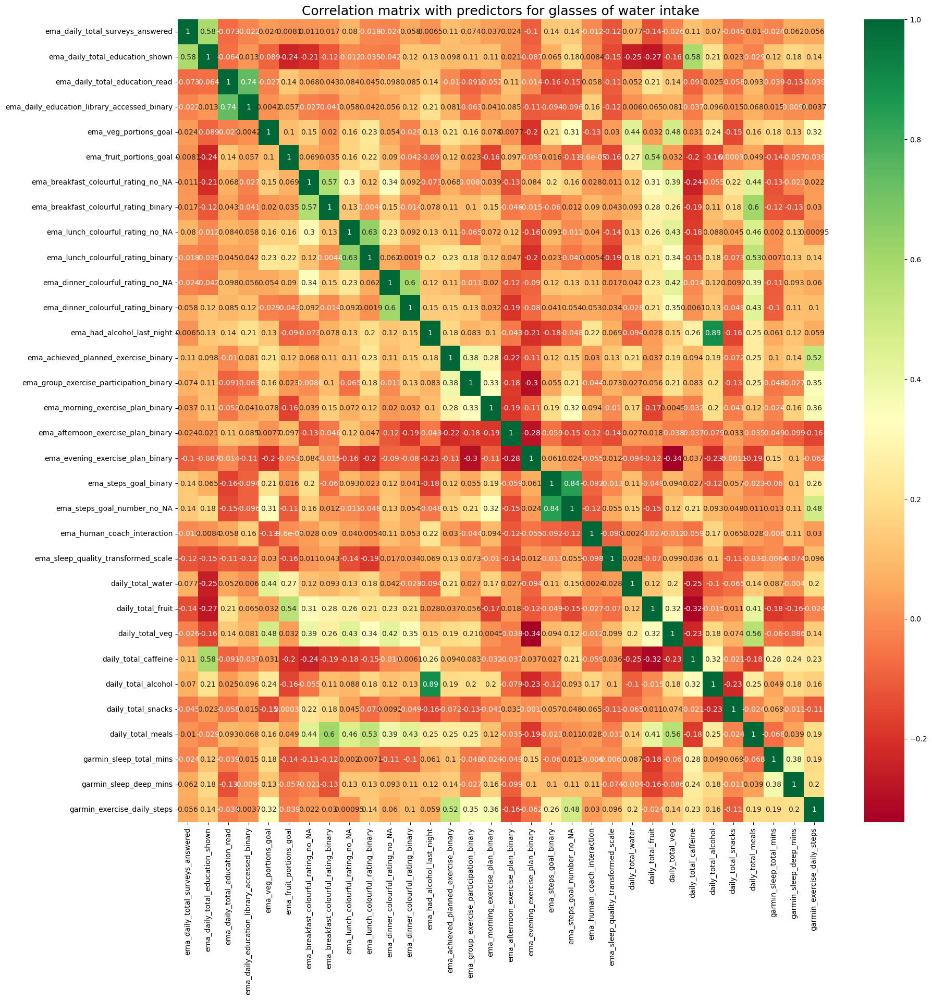

In [78]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for glasses of water intake', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [132]:
#Univariate Selection for Caffeine feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column fruit
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for cups of Coffee intake','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('caffeine_univariate.xlsx', index=False)

       Predictors for cups of Coffee intake         Score
19              ema_steps_goal_number_no_NA  18090.109980
6      ema_breakfast_colourful_rating_no_NA    300.480150
8          ema_lunch_colourful_rating_no_NA    273.216216
10        ema_dinner_colourful_rating_no_NA     88.944773
2            ema_daily_total_education_read     22.473818
4                     ema_veg_portions_goal     11.869682
12               ema_had_alcohol_last_night     10.335758
1           ema_daily_total_education_shown      6.378251
14  ema_group_exercise_participation_binary      5.128239
16       ema_afternoon_exercise_plan_binary      4.570158


[0.03360324 0.12135406 0.02248226 0.02376501 0.08777253 0.06832468
 0.08607956 0.01837266 0.07092232 0.02244507 0.0731783  0.01102311
 0.03108247 0.03295119 0.0240834  0.03500934 0.02922412 0.03073906
 0.02104344 0.07765159 0.03005514 0.04883746]


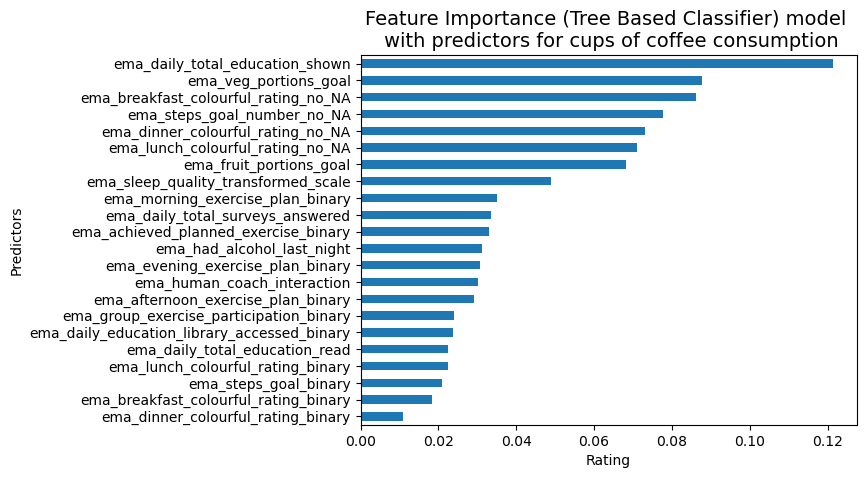

In [133]:
#Feature Importance for caffeine
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column caffeine
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for cups of coffee consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

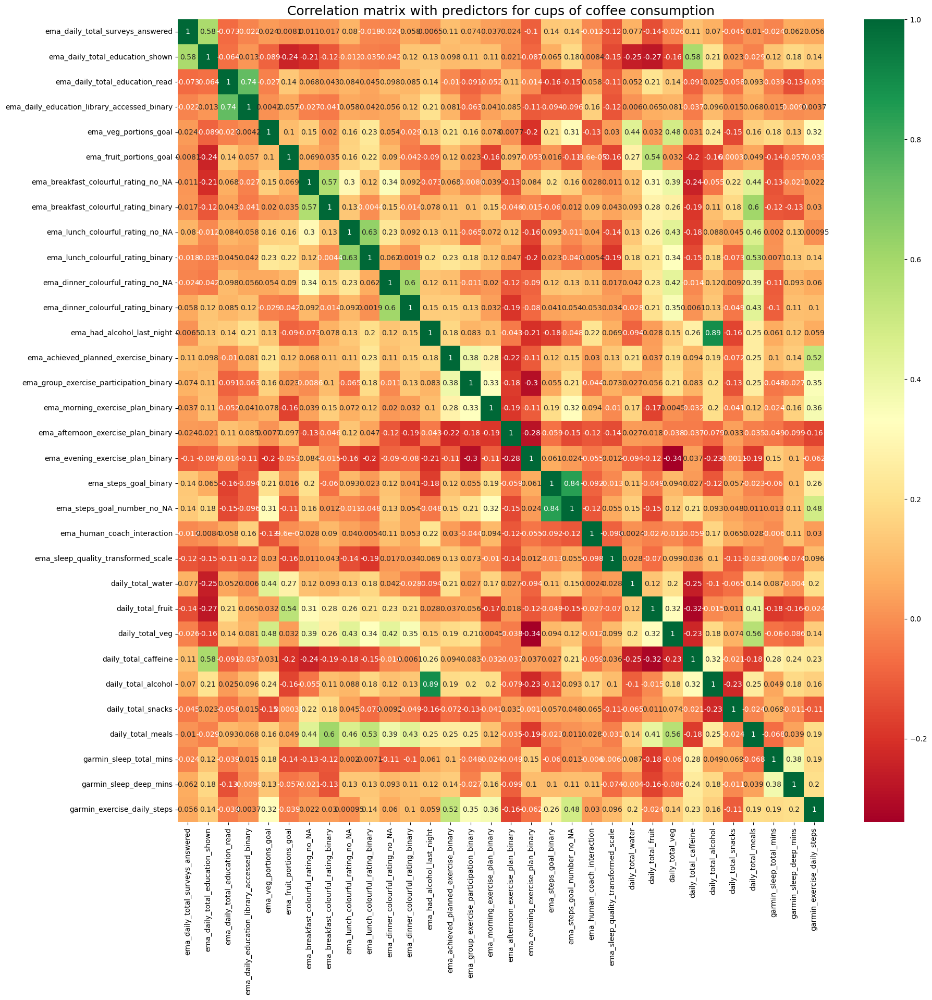

In [81]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column caffeine
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for cups of coffee consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [137]:
#Univariate Selection for alcohol feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column alcohol
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for units of alcoholic beverages consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('alcohol_univariate.xlsx', index=False)

   Predictors for units of alcoholic beverages consumption         Score
19                        ema_steps_goal_number_no_NA       40485.696573
6                ema_breakfast_colourful_rating_no_NA         135.195504
12                         ema_had_alcohol_last_night         111.000000
8                    ema_lunch_colourful_rating_no_NA         101.818845
2                      ema_daily_total_education_read          94.580405
10                  ema_dinner_colourful_rating_no_NA          30.716159
14            ema_group_exercise_participation_binary          13.104624
3         ema_daily_education_library_accessed_binary          13.067703
4                               ema_veg_portions_goal          12.404757
20                        ema_human_coach_interaction          10.710250


[0.01373095 0.02586146 0.0221662  0.0266565  0.03603955 0.03497836
 0.05005422 0.01266565 0.05492256 0.00422981 0.04415016 0.00157255
 0.40084689 0.02695224 0.02677064 0.02621476 0.01524994 0.01695443
 0.01658982 0.05832259 0.03811088 0.04695981]


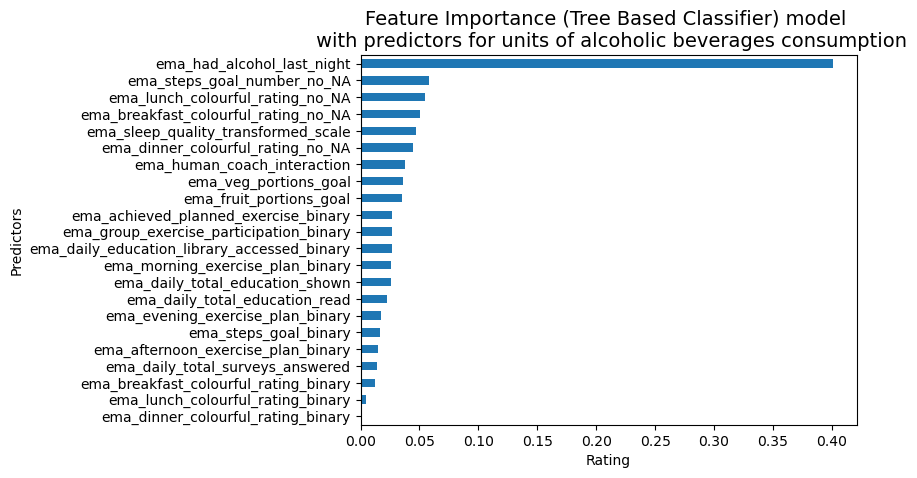

In [142]:
#Feature Importance for alcohol
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column alcohol
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for units of alcoholic beverages consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

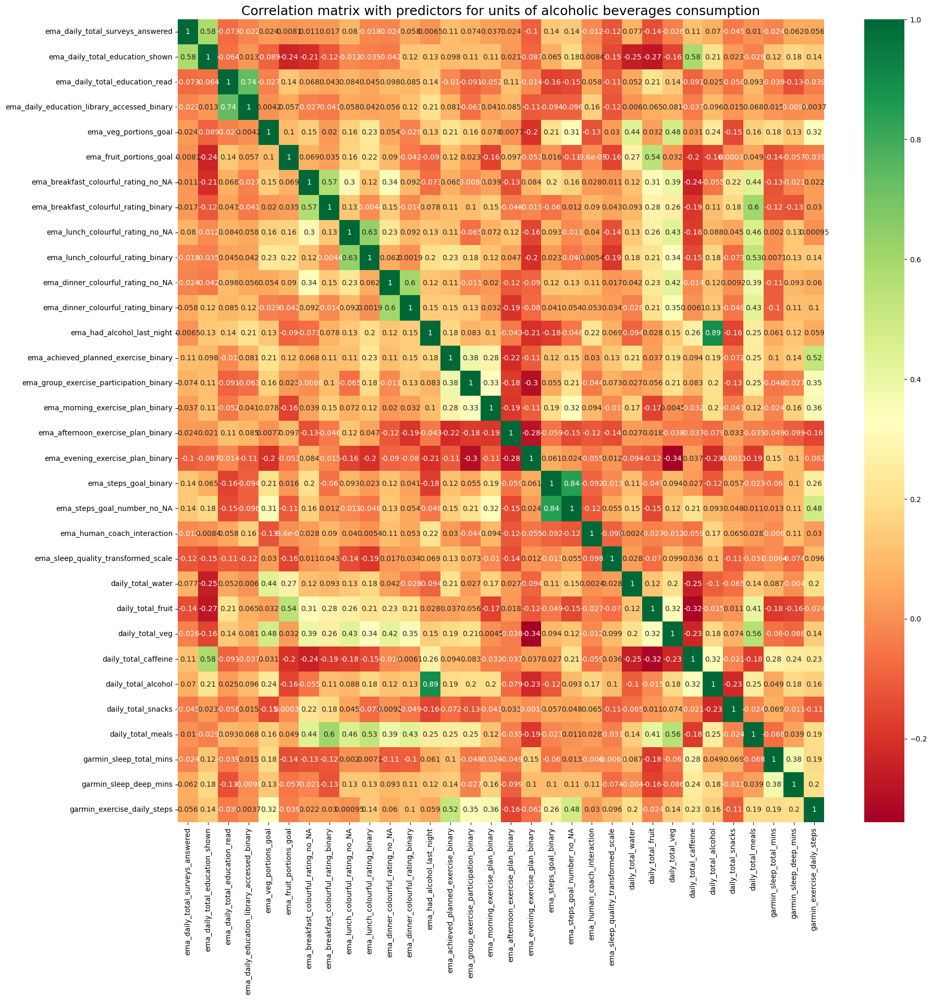

In [84]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column alcohol
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for units of alcoholic beverages consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [140]:
#Univariate Selection for snacks feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for portions of snacks consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('snacks_univariate.xlsx', index=False)

   Predictors for portions of snacks consumption         Score
19                   ema_steps_goal_number_no_NA  25153.578331
6           ema_breakfast_colourful_rating_no_NA    289.580549
10             ema_dinner_colourful_rating_no_NA    116.610552
8               ema_lunch_colourful_rating_no_NA     83.490092
15              ema_morning_exercise_plan_binary     15.804265
14       ema_group_exercise_participation_binary     10.643060
2                 ema_daily_total_education_read      8.596621
20                   ema_human_coach_interaction      6.847514
12                    ema_had_alcohol_last_night      5.584556
4                          ema_veg_portions_goal      5.524118


[0.02332289 0.04670947 0.03562508 0.03296244 0.07541456 0.07655741
 0.09099345 0.01951725 0.08088367 0.01809192 0.07305303 0.0137455
 0.04205881 0.0361773  0.0325865  0.03991952 0.03656593 0.04619926
 0.01673433 0.0746867  0.04008089 0.0481141 ]


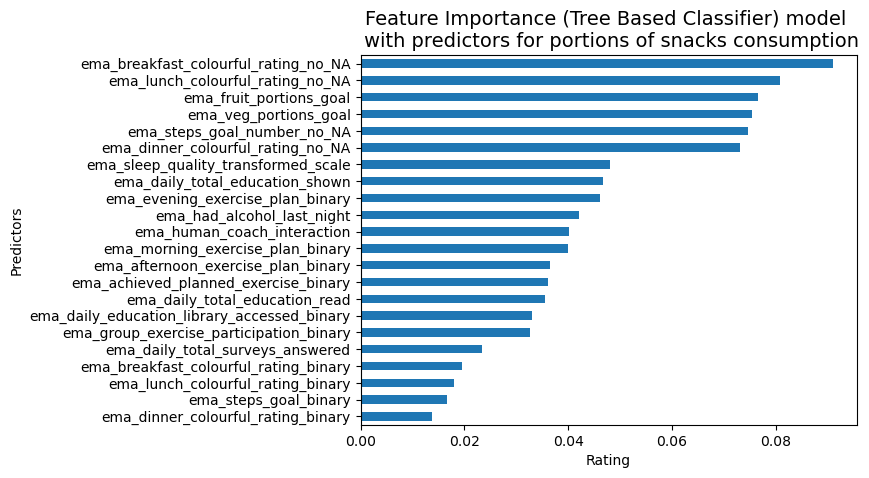

In [143]:
#Feature Importance for snacks
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for portions of snacks consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

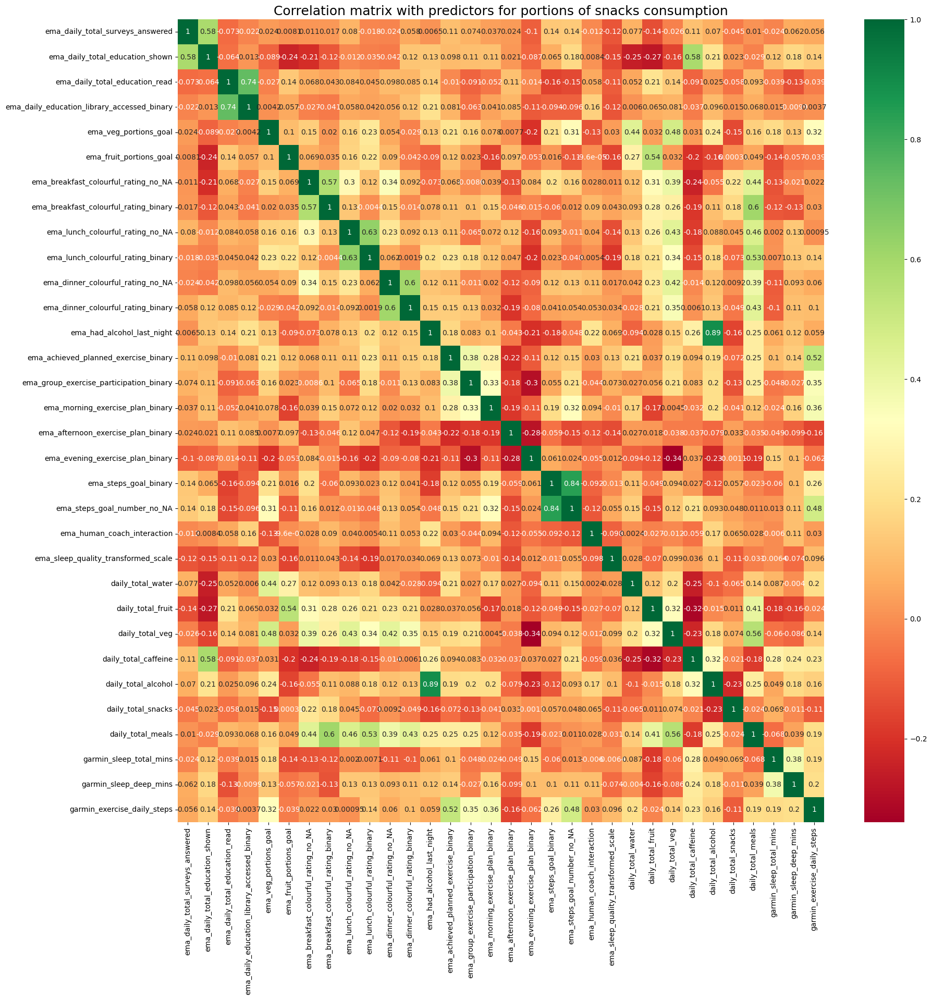

In [87]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for portions of snacks consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [144]:
#Univariate Selection for Meals feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column meals
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for number of meals consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('meals_univariate.xlsx', index=False)

   Predictors for number of meals consumption        Score
19                ema_steps_goal_number_no_NA  1631.654956
6        ema_breakfast_colourful_rating_no_NA   629.492951
8            ema_lunch_colourful_rating_no_NA   556.106835
10          ema_dinner_colourful_rating_no_NA   251.009599
2              ema_daily_total_education_read     8.179459
14    ema_group_exercise_participation_binary     7.871622
12                 ema_had_alcohol_last_night     7.343243
7       ema_breakfast_colourful_rating_binary     7.192821
9           ema_lunch_colourful_rating_binary     4.887807
13       ema_achieved_planned_exercise_binary     4.774775


[0.00873239 0.012924   0.01053192 0.00682237 0.02218711 0.02186217
 0.07188087 0.23141277 0.07563599 0.20436446 0.07249523 0.09724365
 0.01771969 0.01814638 0.017203   0.01228527 0.0098336  0.02023591
 0.00873944 0.02065946 0.01612792 0.02295641]


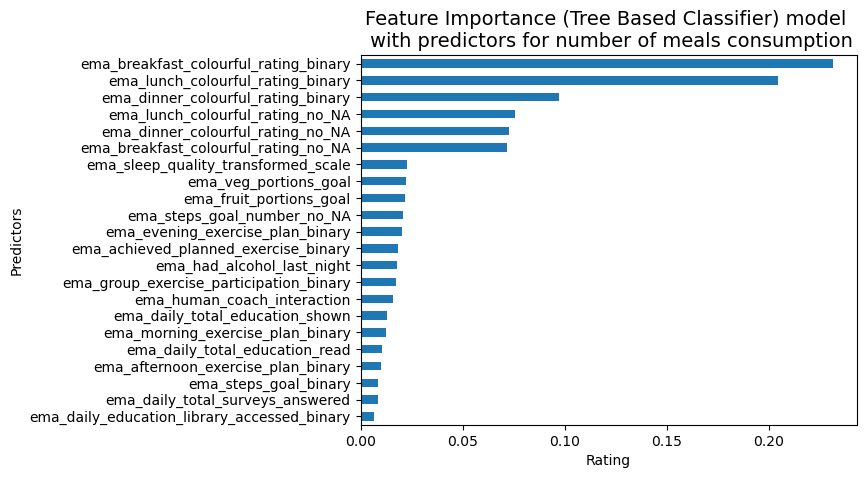

In [145]:
#Feature Importance for meals
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column meals
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for number of meals consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

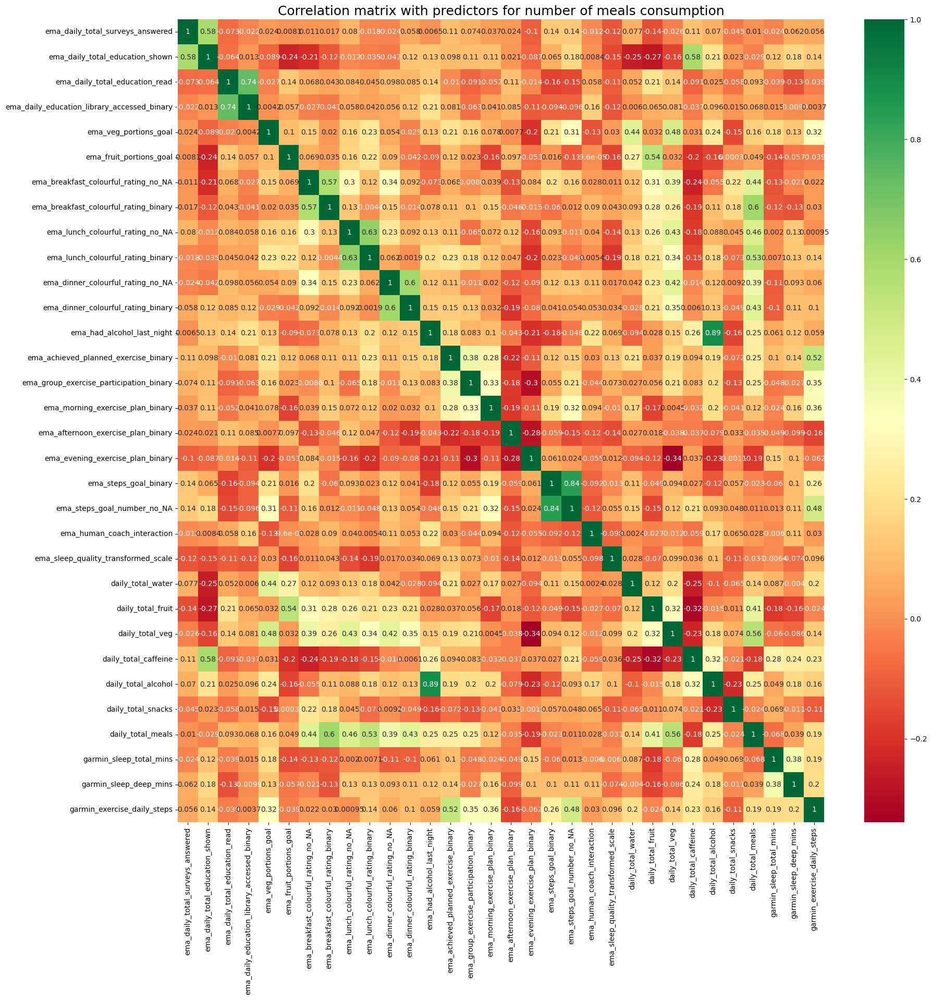

In [90]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column meals
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for number of meals consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")